In [1]:
seed = 11465209
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

# Load dataset

In [2]:
business = pd.read_json('yelp_academic_dataset_business.json', lines = True)
business.describe()

,latitude,longitude,stars,review_count,is_open
count,150346.000000,150346.000000,150346.000000,150346.000000,150346.00000
mean,36.671150,-89.357339,3.596724,44.866561,0.79615
std,5.872759,14.918502,0.974421,121.120136,0.40286
min,27.555127,-120.095137,1.000000,5.000000,0.00000
25%,32.187293,-90.357810,3.000000,8.000000,1.00000
50%,38.777413,-86.121179,3.500000,15.000000,1.00000
75%,39.954036,-75.421542,4.500000,37.000000,1.00000
max,53.679197,-73.200457,5.000000,7568.000000,1.00000


In [35]:
business.describe()

,latitude,longitude,stars,review_count,is_open
count,150346.000000,150346.000000,150346.000000,150346.000000,150346.00000
mean,36.671150,-89.357339,3.596724,44.866561,0.79615
std,5.872759,14.918502,0.974421,121.120136,0.40286
min,27.555127,-120.095137,1.000000,5.000000,0.00000
25%,32.187293,-90.357810,3.000000,8.000000,1.00000
50%,38.777413,-86.121179,3.500000,15.000000,1.00000
75%,39.954036,-75.421542,4.500000,37.000000,1.00000
max,53.679197,-73.200457,5.000000,7568.000000,1.00000


In [4]:
business.dtypes

business_id      object
name             object
address          object
city             object
state            object
postal_code      object
latitude        float64
longitude       float64
stars           float64
review_count      int64
is_open           int64
attributes       object
categories       object
hours            object
dtype: object

In [5]:
review = pd.read_json('yelp_academic_dataset_review.json', lines = True)
review.describe()

,stars,useful,funny,cool
count,6.990280e+06,6.990280e+06,6.990280e+06,6.990280e+06
mean,3.748584e+00,1.184609e+00,3.265596e-01,4.986175e-01
std,1.478705e+00,3.253767e+00,1.688729e+00,2.172460e+00
min,1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00
25%,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,4.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,5.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
max,5.000000e+00,1.182000e+03,7.920000e+02,4.040000e+02


In [16]:
review.columns

Index(['review_id', 'user_id', 'business_id', 'stars', 'useful', 'funny',
       'cool', 'text', 'date', 'vader_result'],
      dtype='object')

# EDA

In [13]:
open_close_count = business.groupby('is_open').count()
open_close_count

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,attributes,categories,hours
is_open,,,,,,,,,,,,,
0,30648,30648,30648,30648,30648,30648,30648,30648,30648,30648,29252,30640,23520
1,119698,119698,119698,119698,119698,119698,119698,119698,119698,119698,107350,119603,103603


In [12]:
len(business[business['is_open'] == 0])/len(business)

0.20384978649249066

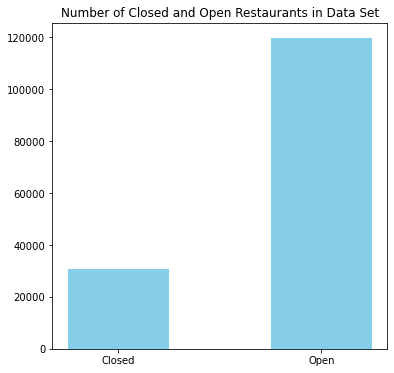

In [20]:
fig = plt.figure(figsize=(6, 6))

ax1 = fig.add_subplot(111)
 
# creating the bar plot
labels = ['Closed', 'Open']

ax1.bar(labels, open_close_count['business_id'], color ='skyblue', width = 0.5)
ax1.set_title("Number of Closed and Open Restaurants in Data Set")

plt.show()

In [43]:
open_rating = business[business['is_open']==1].dropna()['stars'].values
closed_rating = business[business['is_open']==0].dropna()['stars'].values 

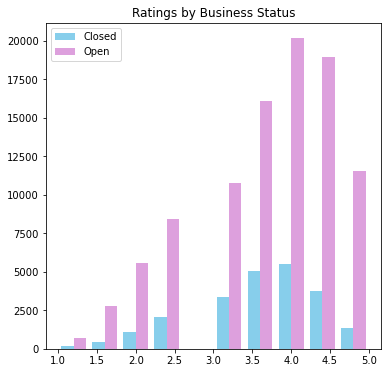

In [44]:
fig = plt.figure(figsize=(6, 6))

ax2 = fig.add_subplot(111)
 
# creating the bar plot
labels = ['Closed', 'Open']

ax2.hist([closed_rating, open_rating], label = labels, color =['skyblue', 'plum'])
ax2.set_title("Ratings by Business Status")
ax2.legend()

plt.show()

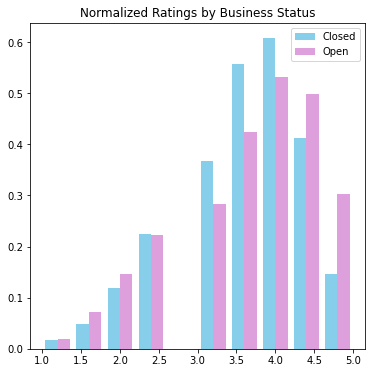

In [49]:
fig = plt.figure(figsize=(6, 6))

ax3 = fig.add_subplot(111)
 
# creating the bar plot
labels = ['Closed', 'Open']

ax3.hist([closed_rating, open_rating], label = labels, color =['skyblue', 'plum'], density = True)
ax3.set_title("Normalized Ratings by Business Status")
ax3.legend()

plt.show()

In [54]:
open_close_rating = business.groupby('is_open').median()
open_close_rating

,latitude,longitude,stars,review_count
is_open,,,,
0,38.856831,-86.130850,3.5,15.0
1,38.766894,-86.118252,4.0,15.0


In [55]:
open_close_rating_avg = business.groupby('is_open').mean()
open_close_rating_avg

,latitude,longitude,stars,review_count
is_open,,,,
0,36.865210,-88.936474,3.510082,37.768566
1,36.621462,-89.465100,3.618908,46.683963


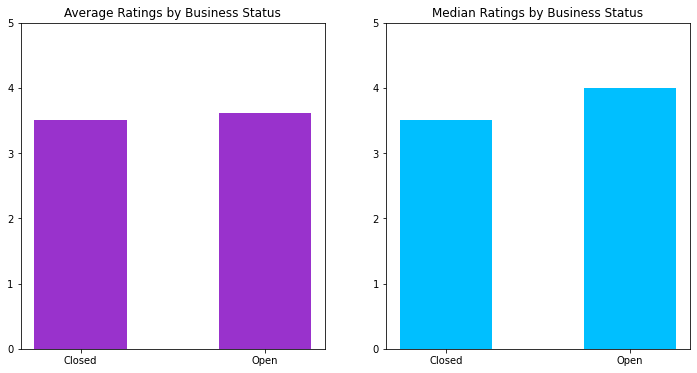

In [56]:
fig = plt.figure(figsize=(12, 6))

ax4 = fig.add_subplot(121)
ax5 = fig.add_subplot(122)
 
# creating the bar plot

# by mean
ax4.bar(labels, open_close_rating_avg['stars'], color ='darkorchid', width = 0.5)
ax4.set_title("Average Ratings by Business Status")
ax4.set_ylim([0.0, 5.0])

# by median
ax5.bar(labels, open_close_rating['stars'], color ='deepskyblue', width = 0.5)
ax5.set_title("Median Ratings by Business Status")
ax5.set_ylim([0.0, 5.0])

plt.show()

In [57]:
open_review = business[business['is_open']==1].dropna()['review_count'].values
closed_review = business[business['is_open']==0].dropna()['review_count'].values 

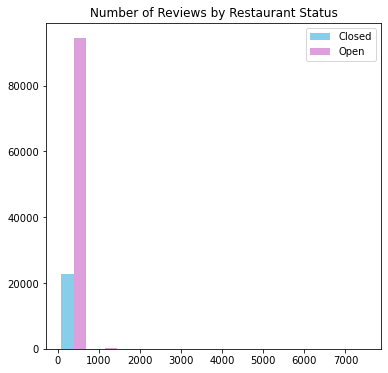

In [58]:
fig = plt.figure(figsize=(6, 6))

ax6 = fig.add_subplot(111)
 
# creating the bar plot
labels = ['Closed', 'Open']

ax6.hist([closed_review, open_review], label = labels, color =['skyblue', 'plum'])
ax6.set_title("Number of Reviews by Restaurant Status")
ax6.legend()

plt.show()

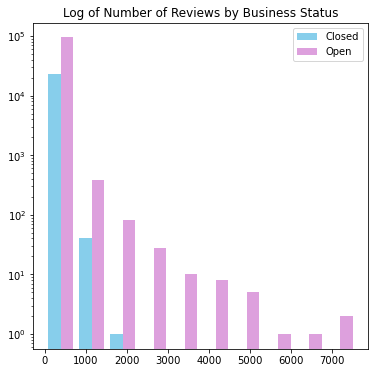

In [59]:
fig = plt.figure(figsize=(6, 6))

ax7 = fig.add_subplot(111)
 
# creating the bar plot
labels = ['Closed', 'Open']

ax7.hist([closed_review, open_review], label = labels, color =['skyblue', 'plum'], log = True)
ax7.set_title("Log of Number of Reviews by Business Status")
ax7.legend()

plt.show()

/Users/hoahduong/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


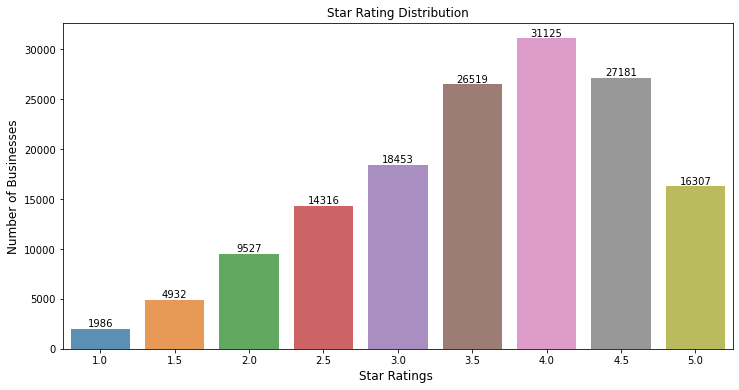

In [60]:
#Get the distribution of the ratings
x = business['stars'].value_counts()
x = x.sort_index()

#plot
fig = plt.figure(figsize=(12, 6))

ax12 = sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Star Rating Distribution")
plt.ylabel('Number of Businesses', fontsize=12)
plt.xlabel('Star Ratings ', fontsize=12)

#adding the text labels
rects = ax12.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax12.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

In [17]:
bus_cat = ','.join(filter(None, (business['categories'])))
bus_cat

"Doctors, Traditional Chinese Medicine, Naturopathic/Holistic, Acupuncture, Health & Medical, Nutritionists,Shipping Centers, Local Services, Notaries, Mailbox Centers, Printing Services,Department Stores, Shopping, Fashion, Home & Garden, Electronics, Furniture Stores,Restaurants, Food, Bubble Tea, Coffee & Tea, Bakeries,Brewpubs, Breweries, Food,Burgers, Fast Food, Sandwiches, Food, Ice Cream & Frozen Yogurt, Restaurants,Sporting Goods, Fashion, Shoe Stores, Shopping, Sports Wear, Accessories,Synagogues, Religious Organizations,Pubs, Restaurants, Italian, Bars, American (Traditional), Nightlife, Greek,Ice Cream & Frozen Yogurt, Fast Food, Burgers, Restaurants, Food,Department Stores, Shopping, Fashion,Vietnamese, Food, Restaurants, Food Trucks,American (Traditional), Restaurants, Diners, Breakfast & Brunch,General Dentistry, Dentists, Health & Medical, Cosmetic Dentists,Food, Delis, Italian, Bakeries, Restaurants,Sushi Bars, Restaurants, Japanese,Automotive, Auto Parts & Supplies, Au

There are  1311  different types/categories of Businesses in Yelp!


/Users/hoahduong/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


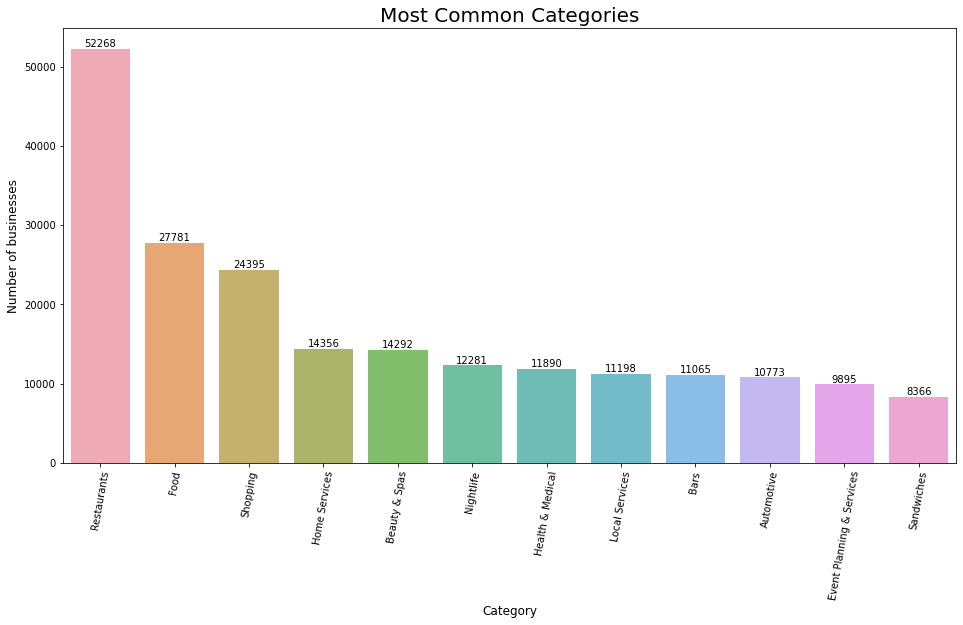

In [34]:
categories = pd.DataFrame(bus_cat.split(','),columns=['category'])
categories['category'] = categories['category'].apply(lambda x: x.strip())
x = categories['category'].value_counts()

print("There are ",len(x)," different types/categories of Businesses in Yelp!")

x = x.sort_values(ascending=False)
x = x.iloc[0:12]

plt.figure(figsize=(16,8))
ax = sns.barplot(x.index, x.values, alpha=0.8)#,color=color[5])
plt.title("Most Common Categories",fontsize=20)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('Number of businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

In [252]:
def get_text(input_list):
    text=''
    
    for word in input_list:
        if word is None:
            continue
        text += word
        
    return text

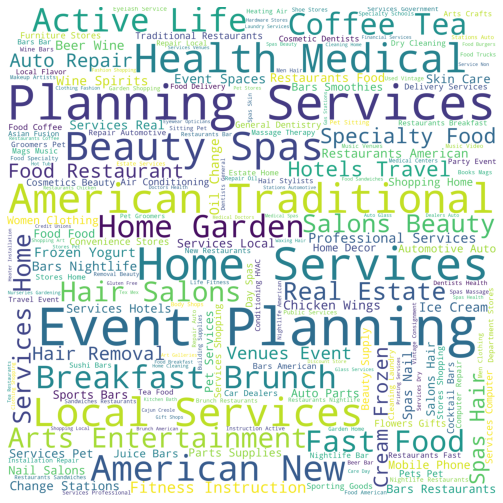

In [253]:
from wordcloud import WordCloud, STOPWORDS

text = get_text(business['categories'])

wordcloud = WordCloud(stopwords = STOPWORDS, background_color = 'white',width = 3000,height = 3000).generate(text)

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [246]:
categories

,category
0,Doctors
1,Traditional Chinese Medicine
2,Naturopathic/Holistic
3,Acupuncture
4,Health & Medical
...,...
668587,Bikes
668588,Beauty & Spas
668589,Permanent Makeup
668590,Piercing


## Restrict to US businesses

In [98]:
business_US = business[((business['latitude']<=51.0) & (business['latitude']>=23.5)) & 
             ((business['longitude']<=-64.5) & (business['longitude']>=-126.0))]
business_US.stars = business_US.stars.astype(int)

/Users/hoahduong/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


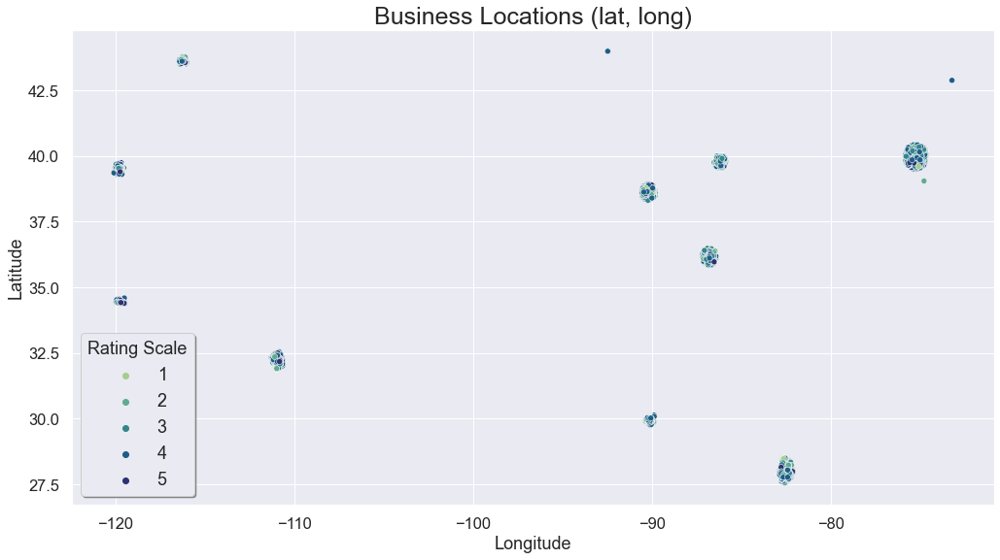

In [99]:
%matplotlib inline

plt.style.use('seaborn')

sns.set(rc={"figure.figsize":(17, 9)}, font_scale=1.5) 
p=sns.scatterplot(data = business_US, x = 'longitude', y = 'latitude', hue = 'stars',
                markers='.', legend='full',palette='crest')

p.set_title('Business Locations (lat, long)', fontsize = 25)
p.set_xlabel("Longitude", fontsize = 18)
p.set_ylabel("Latitude", fontsize = 18)
plt.legend(fontsize='medium', title='Rating Scale', shadow='True', frameon='True')


In [103]:
#!pip install geocoder
import geocoder

def get_state(df):
    g = geocoder.osm([df.latitude, df.longitude], method = 'reverse').json
    if g:
        try:
            state = g.get('state')
            #zip_code = g.get('postcode')
        except:
            pass
        return state
    else:
        return 'no state'

def get_zip(df):
    g = geocoder.osm([df.latitude, df.longitude], method = 'reverse').json
    if g:
        try:
            #state = g.get('state')
            zip_code = g.get('postal')
        except:
            pass
        return zip_code
    else:
        return 'no zip_code'

In [123]:
us_state_to_abbrev = {
    "Alabama": "AL",
    "Alaska": "AK",
    "Arizona": "AZ",
    "Arkansas": "AR",
    "California": "CA",
    "Colorado": "CO",
    "Connecticut": "CT",
    "Delaware": "DE",
    "Florida": "FL",
    "Georgia": "GA",
    "Hawaii": "HI",
    "Idaho": "ID",
    "Illinois": "IL",
    "Indiana": "IN",
    "Iowa": "IA",
    "Kansas": "KS",
    "Kentucky": "KY",
    "Louisiana": "LA",
    "Maine": "ME",
    "Maryland": "MD",
    "Massachusetts": "MA",
    "Michigan": "MI",
    "Minnesota": "MN",
    "Mississippi": "MS",
    "Missouri": "MO",
    "Montana": "MT",
    "Nebraska": "NE",
    "Nevada": "NV",
    "New Hampshire": "NH",
    "New Jersey": "NJ",
    "New Mexico": "NM",
    "New York": "NY",
    "North Carolina": "NC",
    "North Dakota": "ND",
    "Ohio": "OH",
    "Oklahoma": "OK",
    "Oregon": "OR",
    "Pennsylvania": "PA",
    "Rhode Island": "RI",
    "South Carolina": "SC",
    "South Dakota": "SD",
    "Tennessee": "TN",
    "Texas": "TX",
    "Utah": "UT",
    "Vermont": "VT",
    "Virginia": "VA",
    "Washington": "WA",
    "West Virginia": "WV",
    "Wisconsin": "WI",
    "Wyoming": "WY",
    "District of Columbia": "DC",
    "American Samoa": "AS",
    "Guam": "GU",
    "Northern Mariana Islands": "MP",
    "Puerto Rico": "PR",
    "United States Minor Outlying Islands": "UM",
    "U.S. Virgin Islands": "VI",
}
    
# invert the dictionary
abbrev_to_us_state = dict(map(reversed, us_state_to_abbrev.items()))

In [201]:
business_US.replace({'state': abbrev_to_us_state}, inplace = True)
business_US

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,California,93101,34.426679,-119.711197,5,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,Missouri,63123,38.551126,-90.335695,3,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,Arizona,85711,32.223236,-110.880452,3,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,Pennsylvania,19107,39.955505,-75.155564,4,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,Pennsylvania,18054,40.338183,-75.471659,4,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150339,2O2K6SXPWv56amqxCECd4w,The Plum Pit,4405 Pennell Rd,Aston,Delaware,19014,39.856185,-75.427725,4,14,1,"{'RestaurantsDelivery': 'False', 'BusinessAcce...","Restaurants, Comfort Food, Food, Food Trucks, ...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."
150342,c8GjPIOTGVmIemT7j5_SyQ,Wild Birds Unlimited,2813 Bransford Ave,Nashville,Tennessee,37204,36.115118,-86.766925,4,5,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Pets, Nurseries & Gardening, Pet Stores, Hobby...","{'Monday': '9:30-17:30', 'Tuesday': '9:30-17:3..."
150343,_QAMST-NrQobXduilWEqSw,Claire's Boutique,"6020 E 82nd St, Ste 46",Indianapolis,Indiana,46250,39.908707,-86.065088,3,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Shopping, Jewelry, Piercing, Toy Stores, Beaut...",None
150344,mtGm22y5c2UHNXDFAjaPNw,Cyclery & Fitness Center,2472 Troy Rd,Edwardsville,Illinois,62025,38.782351,-89.950558,4,24,1,"{'BusinessParking': '{'garage': False, 'street...","Fitness/Exercise Equipment, Eyewear & Optician...","{'Monday': '9:0-20:0', 'Tuesday': '9:0-20:0', ..."


In [202]:
zip_groups = business_US.groupby('state')
sizes = pd.DataFrame(zip_groups.size())
sizes.reset_index(level=0, inplace=True)
sizes.rename(columns = {0:"Number of Businesses"},inplace = True)
sizes

,state,Number of Businesses
0,Arizona,9912
1,California,5203
2,Colorado,3
3,Delaware,2265
4,Florida,26330
5,Hawaii,2
6,Idaho,4467
7,Illinois,2145
8,Indiana,11247
9,Louisiana,9924


In [203]:
import json
import geojsonio
import folium

m = folium.Map(location = [48.58,-103.46],zoom_start=4)
m.choropleth(geo_data = 'gz_2010_us_040_00_500k.json', data = sizes,
             columns =['state', 'Number of Businesses'],
             key_on = 'feature.properties.NAME',
             fill_color = 'YlGn', fill_opacity = 0.7, line_opacity = 0.8,
             legend_name = 'Distribution of Businesses')
folium.LayerControl().add_to(m)

m

/Users/hoahduong/opt/anaconda3/lib/python3.8/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


## Restrict to Restaurants

In [6]:
restaurant1 = business[business['categories'].str.contains('Restaurants', na = False)]
food1 = business[business['categories'].str.contains('Food', na = False)]
restaurant = pd.concat([restaurant1,food1])
restaurant = restaurant.drop_duplicates(subset = ['business_id']).reset_index()
restaurant.drop('index', axis = 1, inplace = True)
restaurant

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
1,CF33F8-E6oudUQ46HnavjQ,Sonic Drive-In,615 S Main St,Ashland City,TN,37015,36.269593,-87.058943,2.0,6,1,"{'BusinessParking': 'None', 'BusinessAcceptsCr...","Burgers, Fast Food, Sandwiches, Food, Ice Crea...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-22:0', '..."
2,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': 'u'full_bar'', '...","Pubs, Restaurants, Italian, Bars, American (Tr...",None
3,bBDDEgkFA1Otx9Lfe7BZUQ,Sonic Drive-In,2312 Dickerson Pike,Nashville,TN,37207,36.208102,-86.768170,1.5,10,1,"{'RestaurantsAttire': ''casual'', 'Restaurants...","Ice Cream & Frozen Yogurt, Fast Food, Burgers,...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-21:0', '..."
4,eEOYSgkmpB90uNA7lDOMRA,Vietnamese Food Truck,,Tampa Bay,FL,33602,27.955269,-82.456320,4.0,10,1,"{'Alcohol': ''none'', 'OutdoorSeating': 'None'...","Vietnamese, Food, Restaurants, Food Trucks","{'Monday': '11:0-14:0', 'Tuesday': '11:0-14:0'..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64611,0UqeZTDBdV0uY3wesbLvYQ,ampm,1701 Victorian Ave,Sparks,NV,89431,39.534947,-119.765698,4.0,5,1,{'BusinessAcceptsCreditCards': 'True'},"Convenience Stores, Food, Automotive, Gas Stat...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."
64612,7xc84taj12pt-RtZhAfSkQ,Pimped Out Pickles,2801 N Kingshighway Blvd,Saint Louis,MO,63115,38.660185,-90.225247,5.0,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessParki...","Caterers, Convenience Stores, Food, Event Plan...","{'Tuesday': '12:0-18:0', 'Wednesday': '12:0-18..."
64613,WXNag-tmudrFHFlfNLogWg,Whole Foods Market,4577 W Pine Blvd,St. Louis,MO,63108,38.641988,-90.261655,4.0,71,1,"{'RestaurantsPriceRange2': '3', 'DogsAllowed':...","Health Markets, Specialty Food, Food, Grocery","{'Monday': '0:0-0:0', 'Tuesday': '7:0-22:0', '..."
64614,AM7O0cwkxm6w_e0Q7-f9FQ,Starbucks,8817 S US-31,Indianapolis,IN,46227,39.638245,-86.128069,4.0,29,1,"{'RestaurantsPriceRange2': '1', 'Caters': 'Fal...","Food, Coffee & Tea","{'Monday': '6:0-21:0', 'Tuesday': '6:0-21:0', ..."


In [162]:
len(restaurant[restaurant['is_open'] == 0])/len(restaurant)

0.3100470471709793

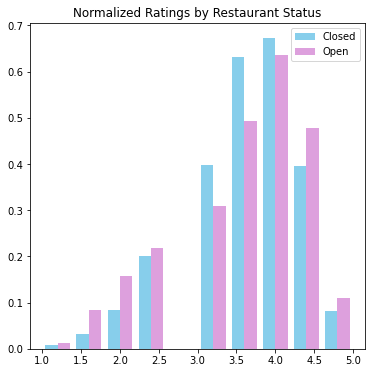

In [61]:
open_rating_r = restaurant[restaurant['is_open']==1].dropna()['stars'].values
closed_rating_r = restaurant[restaurant['is_open']==0].dropna()['stars'].values 

fig = plt.figure(figsize=(6, 6))

ax8 = fig.add_subplot(111)
 
# creating the bar plot
labels = ['Closed', 'Open']

ax8.hist([closed_rating_r, open_rating_r], label = labels, color =['skyblue', 'plum'], density = True)
ax8.set_title("Normalized Ratings by Restaurant Status")
ax8.legend()

plt.show()

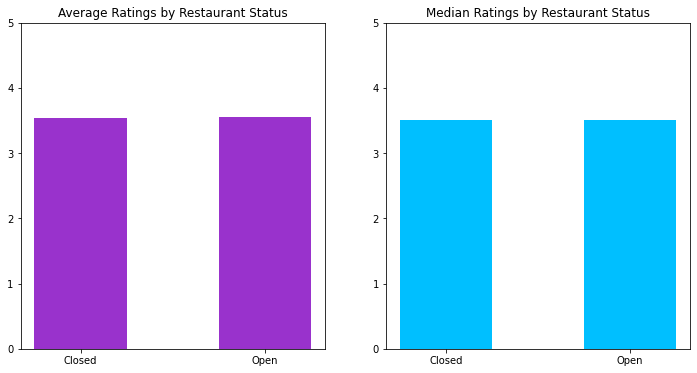

In [62]:
open_close_rating_r = restaurant.groupby('is_open').median()
open_close_rating_avg_r = restaurant.groupby('is_open').mean()

fig = plt.figure(figsize=(12, 6))

ax9 = fig.add_subplot(121)
ax10 = fig.add_subplot(122)
 
# creating the bar plot

# by mean
ax9.bar(labels, open_close_rating_avg_r['stars'], color ='darkorchid', width = 0.5)
ax9.set_title("Average Ratings by Restaurant Status")
ax9.set_ylim([0.0, 5.0])

# by median
ax10.bar(labels, open_close_rating_r['stars'], color ='deepskyblue', width = 0.5)
ax10.set_title("Median Ratings by Restaurant Status")
ax10.set_ylim([0.0, 5.0])

plt.show()

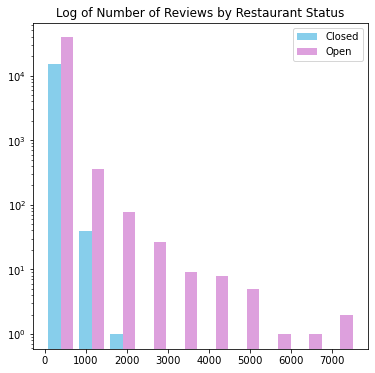

In [51]:
open_review_r = restaurant[restaurant['is_open']==1].dropna()['review_count'].values
closed_review_r = restaurant[restaurant['is_open']==0].dropna()['review_count'].values 

fig = plt.figure(figsize=(6, 6))

ax11 = fig.add_subplot(111)
 
# creating the bar plot
labels = ['Closed', 'Open']

ax11.hist([closed_review_r, open_review_r], label = labels, color =['skyblue', 'plum'], log = True)
ax11.set_title("Log of Number of Reviews by Restaurant Status")
ax11.legend()

plt.show()

In [205]:
restaurant_US = restaurant[((restaurant['latitude']<=51.0) & (restaurant['latitude']>=23.5)) & 
             ((restaurant['longitude']<=-64.5) & (restaurant['longitude']>=-126.0))]
restaurant_US.stars = restaurant.stars.astype(int)

restaurant_US.replace({'state': abbrev_to_us_state}, inplace = True)


/Users/hoahduong/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [207]:
zip_groups_r = restaurant_US.groupby('state')
sizes_r = pd.DataFrame(zip_groups_r.size())
sizes_r.reset_index(level=0, inplace=True)
sizes_r.rename(columns = {0:"Number of Restaurants"},inplace = True)

m_r = folium.Map(location = [48.58,-103.46],zoom_start=4)
m_r.choropleth(geo_data = 'gz_2010_us_040_00_500k.json', data = sizes_r,
             columns =['state', 'Number of Restaurants'],
             key_on = 'feature.properties.NAME',
             fill_color = 'YlGn', fill_opacity = 0.7, line_opacity = 0.8,
             legend_name = 'Distribution of Restaurants')
folium.LayerControl().add_to(m_r)

m_r

/Users/hoahduong/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


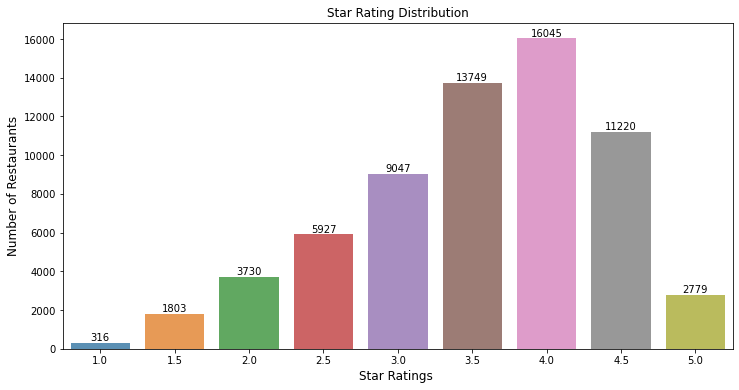

In [63]:
#Get the distribution of the ratings
x = restaurant['stars'].value_counts()
x = x.sort_index()

#plot
fig = plt.figure(figsize=(12, 6))

ax13 = sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Star Rating Distribution")
plt.ylabel('Number of Restaurants', fontsize=12)
plt.xlabel('Star Ratings ', fontsize=12)

#adding the text labels
rects = ax13.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax13.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

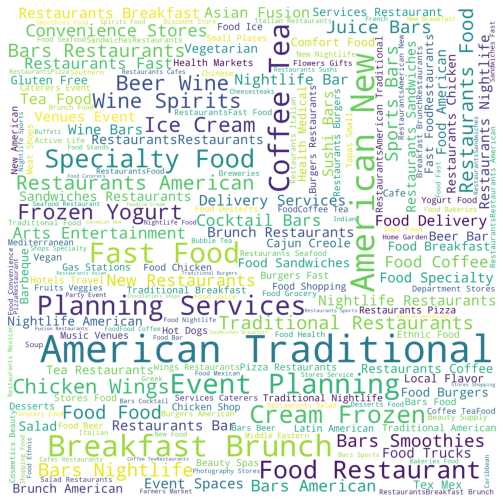

In [254]:
text = get_text(restaurant['categories'])

wordcloud = WordCloud(stopwords = STOPWORDS, background_color = 'white',width = 3000,height = 3000).generate(text)

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

# Vader Analysis

In [7]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()

def vader_sentiment_result(sent):
    scores = analyzer.polarity_scores(sent)
    
    if scores["neg"] > scores["pos"]:
        return 0

    return 1

review["vader_result"] = review["text"].apply(lambda x: vader_sentiment_result(x))

# Add reviews features

In [8]:
grouped_reviews = review.groupby('business_id').mean()
grouped_reviews

,stars,useful,funny,cool,vader_result
business_id,,,,,
---kPU91CF4Lq2-WlRu9Lw,4.500000,0.666667,0.041667,0.541667,1.000000
--0iUa4sNDFiZFrAdIWhZQ,3.214286,1.785714,0.214286,0.285714,0.785714
--30_8IhuyMHbSOcNWd6DQ,3.555556,0.777778,0.222222,0.000000,0.777778
--7PUidqRWpRSpXebiyxTg,1.750000,0.750000,0.166667,0.000000,0.583333
--7jw19RH9JKXgFohspgQw,4.230769,1.230769,0.000000,0.000000,0.846154
...,...,...,...,...,...
zznZqH9CiAznbkV6fXyHWA,4.916667,1.916667,0.250000,1.416667,1.000000
zztOG2cKm87I6Iw_tleZsQ,4.833333,0.166667,0.000000,0.333333,1.000000
zzu6_r3DxBJuXcjnOYVdTw,3.625000,1.125000,0.000000,0.375000,1.000000


In [9]:
grouped_reviews_count = review.groupby('business_id').count()
grouped_reviews_count

,review_id,user_id,stars,useful,funny,cool,text,date,vader_result
business_id,,,,,,,,,
---kPU91CF4Lq2-WlRu9Lw,24,24,24,24,24,24,24,24,24
--0iUa4sNDFiZFrAdIWhZQ,14,14,14,14,14,14,14,14,14
--30_8IhuyMHbSOcNWd6DQ,9,9,9,9,9,9,9,9,9
--7PUidqRWpRSpXebiyxTg,12,12,12,12,12,12,12,12,12
--7jw19RH9JKXgFohspgQw,13,13,13,13,13,13,13,13,13
...,...,...,...,...,...,...,...,...,...
zznZqH9CiAznbkV6fXyHWA,12,12,12,12,12,12,12,12,12
zztOG2cKm87I6Iw_tleZsQ,6,6,6,6,6,6,6,6,6
zzu6_r3DxBJuXcjnOYVdTw,8,8,8,8,8,8,8,8,8


In [10]:
grouped_reviews_sum = review.groupby('business_id').sum()
grouped_reviews_sum

,stars,useful,funny,cool,vader_result
business_id,,,,,
---kPU91CF4Lq2-WlRu9Lw,108,16,1,13,24
--0iUa4sNDFiZFrAdIWhZQ,45,25,3,4,11
--30_8IhuyMHbSOcNWd6DQ,32,7,2,0,7
--7PUidqRWpRSpXebiyxTg,21,9,2,0,7
--7jw19RH9JKXgFohspgQw,55,16,0,0,11
...,...,...,...,...,...
zznZqH9CiAznbkV6fXyHWA,59,23,3,17,12
zztOG2cKm87I6Iw_tleZsQ,29,1,0,2,6
zzu6_r3DxBJuXcjnOYVdTw,29,9,0,3,8


In [11]:
grouped_reviews_median = review.groupby('business_id').median()
grouped_reviews_median

,stars,useful,funny,cool,vader_result
business_id,,,,,
---kPU91CF4Lq2-WlRu9Lw,5.0,0.0,0.0,0.0,1.0
--0iUa4sNDFiZFrAdIWhZQ,3.5,1.5,0.0,0.0,1.0
--30_8IhuyMHbSOcNWd6DQ,5.0,0.0,0.0,0.0,1.0
--7PUidqRWpRSpXebiyxTg,1.0,0.5,0.0,0.0,1.0
--7jw19RH9JKXgFohspgQw,5.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...
zznZqH9CiAznbkV6fXyHWA,5.0,2.0,0.0,1.0,1.0
zztOG2cKm87I6Iw_tleZsQ,5.0,0.0,0.0,0.0,1.0
zzu6_r3DxBJuXcjnOYVdTw,4.0,0.5,0.0,0.0,1.0


In [12]:
review_features = pd.merge(grouped_reviews[['stars', 'vader_result']], 
                           grouped_reviews_count['review_id'], on = 'business_id')
review_features = pd.merge(review_features, grouped_reviews_sum.iloc[:, 1:4], on = 'business_id')

review_features.rename(columns = {'stars':"avg_rating", 'vader_result':'avg_vader'}, inplace = True)

review_features = pd.merge(review_features, grouped_reviews_median[['stars', 'vader_result']], on = 'business_id') 
review_features.rename(columns = {'stars':"median_rating", 'vader_result':'median_vader'}, inplace = True)
review_features

,avg_rating,avg_vader,review_id,useful,funny,cool,median_rating,median_vader
business_id,,,,,,,,
---kPU91CF4Lq2-WlRu9Lw,4.500000,1.000000,24,16,1,13,5.0,1.0
--0iUa4sNDFiZFrAdIWhZQ,3.214286,0.785714,14,25,3,4,3.5,1.0
--30_8IhuyMHbSOcNWd6DQ,3.555556,0.777778,9,7,2,0,5.0,1.0
--7PUidqRWpRSpXebiyxTg,1.750000,0.583333,12,9,2,0,1.0,1.0
--7jw19RH9JKXgFohspgQw,4.230769,0.846154,13,16,0,0,5.0,1.0
...,...,...,...,...,...,...,...,...
zznZqH9CiAznbkV6fXyHWA,4.916667,1.000000,12,23,3,17,5.0,1.0
zztOG2cKm87I6Iw_tleZsQ,4.833333,1.000000,6,1,0,2,5.0,1.0
zzu6_r3DxBJuXcjnOYVdTw,3.625000,1.000000,8,9,0,3,4.0,1.0


In [13]:
business_review = pd.merge(business, review_features, on = 'business_id')
business_review

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,categories,hours,avg_rating,avg_vader,review_id,useful,funny,cool,median_rating,median_vader
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,...,"Doctors, Traditional Chinese Medicine, Naturop...",None,4.857143,0.857143,7,9,3,1,5.0,1.0
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,...,"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ...",3.133333,0.933333,15,19,6,6,4.0,1.0
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,...,"Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",3.500000,1.000000,24,21,20,12,4.0,1.0
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,...,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",4.057471,0.885057,87,131,47,95,4.0,1.0
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,...,"Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2...",4.692308,0.923077,13,2,0,0,5.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150341,IUQopTMmYQG-qRtBk-8QnA,Binh's Nails,3388 Gateway Blvd,Edmonton,AB,T6J 5H2,53.468419,-113.492054,3.0,13,...,"Nail Salons, Beauty & Spas","{'Monday': '10:0-19:30', 'Tuesday': '10:0-19:3...",3.000000,0.714286,14,16,0,1,4.0,1.0
150342,c8GjPIOTGVmIemT7j5_SyQ,Wild Birds Unlimited,2813 Bransford Ave,Nashville,TN,37204,36.115118,-86.766925,4.0,5,...,"Pets, Nurseries & Gardening, Pet Stores, Hobby...","{'Monday': '9:30-17:30', 'Tuesday': '9:30-17:3...",4.333333,0.833333,6,8,2,6,5.0,1.0
150343,_QAMST-NrQobXduilWEqSw,Claire's Boutique,"6020 E 82nd St, Ste 46",Indianapolis,IN,46250,39.908707,-86.065088,3.5,8,...,"Shopping, Jewelry, Piercing, Toy Stores, Beaut...",None,3.500000,0.750000,8,7,5,6,4.0,1.0
150344,mtGm22y5c2UHNXDFAjaPNw,Cyclery & Fitness Center,2472 Troy Rd,Edwardsville,IL,62025,38.782351,-89.950558,4.0,24,...,"Fitness/Exercise Equipment, Eyewear & Optician...","{'Monday': '9:0-20:0', 'Tuesday': '9:0-20:0', ...",3.916667,0.833333,24,35,4,11,5.0,1.0


In [14]:
from pathlib import Path  
filepath = Path('business_review.csv') 

business_review.to_csv(filepath)

# Breakdown Restaurants Attributes

In [37]:
attributes = []
df2 = restaurant.copy()

for i in df2["attributes"]:
  try:
    attributes.append(list(i.keys()))
  except:
    continue

In [38]:
import itertools

flat = list(itertools.chain(*attributes))

flat

['RestaurantsDelivery',
 'OutdoorSeating',
 'BusinessAcceptsCreditCards',
 'BusinessParking',
 'BikeParking',
 'RestaurantsPriceRange2',
 'RestaurantsTakeOut',
 'ByAppointmentOnly',
 'WiFi',
 'Alcohol',
 'Caters',
 'BusinessParking',
 'BusinessAcceptsCreditCards',
 'RestaurantsAttire',
 'OutdoorSeating',
 'RestaurantsReservations',
 'Caters',
 'RestaurantsTakeOut',
 'Alcohol',
 'Ambience',
 'GoodForKids',
 'RestaurantsPriceRange2',
 'ByAppointmentOnly',
 'CoatCheck',
 'DogsAllowed',
 'RestaurantsTableService',
 'RestaurantsGoodForGroups',
 'RestaurantsDelivery',
 'WiFi',
 'WheelchairAccessible',
 'HasTV',
 'HappyHour',
 'DriveThru',
 'BikeParking',
 'Caters',
 'Alcohol',
 'RestaurantsAttire',
 'RestaurantsDelivery',
 'RestaurantsTakeOut',
 'HasTV',
 'NoiseLevel',
 'BusinessAcceptsCreditCards',
 'OutdoorSeating',
 'BusinessParking',
 'Ambience',
 'RestaurantsPriceRange2',
 'GoodForKids',
 'WiFi',
 'RestaurantsReservations',
 'RestaurantsGoodForGroups',
 'RestaurantsAttire',
 'Restaurant

In [39]:
from collections import Counter
d = (Counter(flat))
test = (d.most_common())

<BarContainer object of 39 artists>

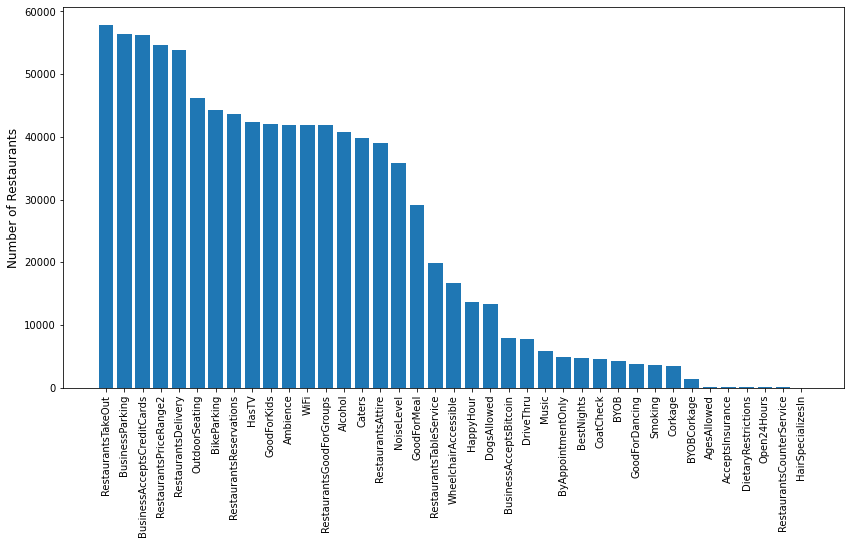

In [40]:
x1 = []
y1 = []
for i in test:
  x1.append(i[0])
  y1.append(i[1])

    
plt.figure(figsize=(14,7))
plt.ylabel('Number of Restaurants', fontsize=12)
plt.xticks(rotation=90)
plt.bar(x1,y1)

In [291]:
test = df2.copy()

for s in range(5):
  print(s)

  test[str(x1[s])] = 0
  for k in range(len(df2)):
    
    try:
      if s==1:
        if str(x1[s]) in df.iloc[k]["attributes"].keys():
          if df.iloc[k]["attributes"][x1[s]]=="None":
            test[str(x1[s])][k] = 0
          else:
            test[str(x1[s])][k] = 1

      elif s==3:
        test[str(x1[s])][k] = df.iloc[k]["attributes"][x1[s]]

      else:
        if str(x1[s]) in df.iloc[k]["attributes"].keys():
          if df.iloc[k]["attributes"][x1[s]]=="True":
            test[str(x1[s])][k] = 1
          elif df.iloc[k]["attributes"][x1[s]]=="False":
            test[str(x1[s])][k] = 0
    except:
      continue

0
1
2
3
4


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,RestaurantsTakeOut,BusinessParking,BusinessAcceptsCreditCards,RestaurantsPriceRange2,RestaurantsDelivery
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ...",0,0,0,0,0
1,CF33F8-E6oudUQ46HnavjQ,Sonic Drive-In,615 S Main St,Ashland City,TN,37015,36.269593,-87.058943,2.0,6,1,"{'BusinessParking': 'None', 'BusinessAcceptsCr...","Burgers, Fast Food, Sandwiches, Food, Ice Crea...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-22:0', '...",0,0,0,0,0
2,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': 'u'full_bar'', '...","Pubs, Restaurants, Italian, Bars, American (Tr...",None,0,0,0,0,0
3,bBDDEgkFA1Otx9Lfe7BZUQ,Sonic Drive-In,2312 Dickerson Pike,Nashville,TN,37207,36.208102,-86.768170,1.5,10,1,"{'RestaurantsAttire': ''casual'', 'Restaurants...","Ice Cream & Frozen Yogurt, Fast Food, Burgers,...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-21:0', '...",0,0,0,0,0
4,eEOYSgkmpB90uNA7lDOMRA,Vietnamese Food Truck,,Tampa Bay,FL,33602,27.955269,-82.456320,4.0,10,1,"{'Alcohol': ''none'', 'OutdoorSeating': 'None'...","Vietnamese, Food, Restaurants, Food Trucks","{'Monday': '11:0-14:0', 'Tuesday': '11:0-14:0'...",0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64611,0UqeZTDBdV0uY3wesbLvYQ,ampm,1701 Victorian Ave,Sparks,NV,89431,39.534947,-119.765698,4.0,5,1,{'BusinessAcceptsCreditCards': 'True'},"Convenience Stores, Food, Automotive, Gas Stat...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",0,0,0,0,0
64612,7xc84taj12pt-RtZhAfSkQ,Pimped Out Pickles,2801 N Kingshighway Blvd,Saint Louis,MO,63115,38.660185,-90.225247,5.0,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessParki...","Caterers, Convenience Stores, Food, Event Plan...","{'Tuesday': '12:0-18:0', 'Wednesday': '12:0-18...",0,0,0,0,0
64613,WXNag-tmudrFHFlfNLogWg,Whole Foods Market,4577 W Pine Blvd,St. Louis,MO,63108,38.641988,-90.261655,4.0,71,1,"{'RestaurantsPriceRange2': '3', 'DogsAllowed':...","Health Markets, Specialty Food, Food, Grocery","{'Monday': '0:0-0:0', 'Tuesday': '7:0-22:0', '...",0,0,0,0,0
64614,AM7O0cwkxm6w_e0Q7-f9FQ,Starbucks,8817 S US-31,Indianapolis,IN,46227,39.638245,-86.128069,4.0,29,1,"{'RestaurantsPriceRange2': '1', 'Caters': 'Fal...","Food, Coffee & Tea","{'Monday': '6:0-21:0', 'Tuesday': '6:0-21:0', ...",0,0,0,0,0


In [293]:
rest_attributes = test.iloc[:, 14:19]
rest_attributes['business_id'] = test['business_id']
rest_attributes

,RestaurantsTakeOut,BusinessParking,BusinessAcceptsCreditCards,RestaurantsPriceRange2,RestaurantsDelivery,business_id
0,0,0,0,0,0,MTSW4McQd7CbVtyjqoe9mw
1,0,0,0,0,0,CF33F8-E6oudUQ46HnavjQ
2,0,0,0,0,0,k0hlBqXX-Bt0vf1op7Jr1w
3,0,0,0,0,0,bBDDEgkFA1Otx9Lfe7BZUQ
4,0,0,0,0,0,eEOYSgkmpB90uNA7lDOMRA
...,...,...,...,...,...,...
64611,0,0,0,0,0,0UqeZTDBdV0uY3wesbLvYQ
64612,0,0,0,0,0,7xc84taj12pt-RtZhAfSkQ
64613,0,0,0,0,0,WXNag-tmudrFHFlfNLogWg
64614,0,0,0,0,0,AM7O0cwkxm6w_e0Q7-f9FQ


In [295]:
rest_features = pd.merge(business_review, rest_attributes, on = 'business_id')
rest_features

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,review_id,useful,funny,cool,median_rating,RestaurantsTakeOut,BusinessParking,BusinessAcceptsCreditCards,RestaurantsPriceRange2,RestaurantsDelivery
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,...,87,131,47,95,4.0,0,0,0,0,0
1,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,...,13,2,0,0,5.0,0,0,0,0,0
2,CF33F8-E6oudUQ46HnavjQ,Sonic Drive-In,615 S Main St,Ashland City,TN,37015,36.269593,-87.058943,2.0,6,...,6,0,0,0,1.5,0,0,0,0,0
3,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,...,19,21,9,4,4.0,0,0,0,0,0
4,bBDDEgkFA1Otx9Lfe7BZUQ,Sonic Drive-In,2312 Dickerson Pike,Nashville,TN,37207,36.208102,-86.768170,1.5,10,...,10,2,2,0,1.0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64611,cM6V90ExQD6KMSU3rRB5ZA,Dutch Bros Coffee,1181 N Milwaukee St,Boise,ID,83704,43.615401,-116.284689,4.0,33,...,34,34,14,18,5.0,0,0,0,0,0
64612,1jx1sfgjgVg0nM6n3p0xWA,Savaya Coffee Market,11177 N Oracle Rd,Oro Valley,AZ,85737,32.409552,-110.943073,4.5,41,...,43,86,5,20,5.0,0,0,0,0,0
64613,WnT9NIzQgLlILjPT0kEcsQ,Adelita Taqueria & Restaurant,1108 S 9th St,Philadelphia,PA,19147,39.935982,-75.158665,4.5,35,...,35,24,9,9,5.0,0,0,0,0,0
64614,2O2K6SXPWv56amqxCECd4w,The Plum Pit,4405 Pennell Rd,Aston,DE,19014,39.856185,-75.427725,4.5,14,...,14,21,5,15,5.0,0,0,0,0,0


In [297]:
from pathlib import Path  
filepath = Path('restaurant_features.csv') 

rest_features.to_csv(filepath)